# Importing the libraries & Loading the data

In [ ]:
# Standard library
import os
import sys
import glob
import math
import gc
import random

# Arrays and image processing
import numpy as np
from PIL import Image
from scipy.ndimage import rotate

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import rgb_to_hsv

# TensorFlow / Keras (keep only if needed)
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import backend as K

# scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, adjusted_rand_score, mean_squared_error

# UMAP
try:
    import umap
except ImportError:
    !pip install umap-learn
    import umap

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# Diffusers (Stable Diffusion components)
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler

# Reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

In [ ]:
# Install and import required libraries for Stable Diffusion VAE
try:
    import diffusers
    import torch
    print("✓ diffusers and torch already installed")
except ImportError:
    print("Installing diffusers, transformers, and accelerate...")
    import subprocess
    import sys
    subprocess.check_call([sys.executable, "-m", "pip", "install", "diffusers", "transformers", "accelerate", "torch"])
    import diffusers
    import torch
    print("✓ Libraries installed successfully")

from diffusers import AutoencoderKL

print(f"\n✓ All required libraries loaded")
print(f"  PyTorch version: {torch.__version__}")
print(f"  Device available: {'cuda' if torch.cuda.is_available() else 'cpu'}")

✓ diffusers and torch already installed


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.



✓ All required libraries loaded
  PyTorch version: 2.9.0+cu126
  Device available: cuda


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Path to the images
DATA_GLOB = "/content/drive/MyDrive/food_images/*"

# Target image size
IMG_HEIGHT = 128
IMG_WIDTH = 128
IMG_CHANNELS = 3
TARGET_SIZE = (IMG_WIDTH, IMG_HEIGHT)   # PIL uses (width, height)

In [ ]:
# Collect all image paths
image_paths = sorted(glob.glob(DATA_GLOB))

print(f"Found {len(image_paths)} image files.")
image_paths[:10]

Found 569 image files.


['/content/drive/MyDrive/food_images/01ABB14B-7FA2-43C6-83EA-5D7F1EE0B1A7_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/04D815BE-3905-4DDF-A9E2-5259211A2A1F_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/04E32FFC-567F-450F-B20C-C0D26E043A37_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/057248DA-87C3-4AAC-B36D-9B79E743A258_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/05D4B527-9EEC-484B-886B-ABD97B1E9365_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/0719C9D7-1F9E-4AED-A6AB-B81BF8B437DA_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/0813A2B5-E3B5-44CC-8A0D-2D9BEB0A3007_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/08EC11C4-EA23-45B1-82F2-381FB4FCD903_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/0BCB7385-B0A5-40EF-933F-05A1AFB5959F_4_5005_c.jpeg',
 '/content/drive/MyDrive/food_images/0D343749-4E82-4C5D-9577-0F5D7C70E097_4_5005_c.jpeg']

In [ ]:
# Load all images and preprocess them
def preprocess_images(image_paths, target_size=(128, 128), verbose=True):
    """
    Load and preprocess all images.

    Parameters:
    - image_paths: List of image file paths
    - target_size: Tuple (height, width) for resizing
    - verbose: Whether to print progress

    Returns:
    - X_raw: NumPy array of shape (N, H, W, C) with uint8 values [0, 255]
    - X_proc: NumPy array of shape (N, H, W, C) with float32 values [0, 1]
    """
    images = []
    failed = []

    if verbose:
        print(f"Loading and preprocessing {len(image_paths)} images...")
        print(f"Target size: {target_size}")

    for i, img_path in enumerate(image_paths):
        try:
            # Load image
            img = Image.open(img_path)

            if img.mode != 'RGB':
                img = img.convert('RGB')

            # Resize to target size
            img_resized = img.resize(target_size, Image.Resampling.LANCZOS)

            # Convert PIL Image to NumPy array
            img_array = np.array(img_resized, dtype=np.uint8)

            images.append(img_array)

            if verbose and (i + 1) % 50 == 0:
                print(f"  Processed {i + 1}/{len(image_paths)} images...")

        except Exception as e:
            failed.append((img_path, str(e)))
            if verbose:
                print(f"  Warning: Failed to load {os.path.basename(img_path)}: {e}")

    if failed:
        print(f"\n⚠ Failed to load {len(failed)} images")

    # Stack all images into a single NumPy array
    # Shape: (N, H, W, C) where N=number of images, H=height, W=width, C=channels (3 for RGB)
    X_raw = np.stack(images, axis=0)

    print(f"  X_raw shape: {X_raw.shape}, dtype: {X_raw.dtype}")

    return X_raw, failed

# Preprocess all images
# The Stable Diffusion VAE was trained on 256×256 images and expects that resolution
X_raw, failed_images = preprocess_images(image_paths, target_size=(256, 256))

Loading and preprocessing 569 images...
Target size: (256, 256)
  Processed 50/569 images...
  Processed 100/569 images...
  Processed 150/569 images...
  Processed 200/569 images...
  Processed 250/569 images...
  Processed 300/569 images...
  Processed 350/569 images...
  Processed 400/569 images...
  Processed 450/569 images...
  Processed 500/569 images...
  Processed 550/569 images...
  X_raw shape: (569, 256, 256, 3), dtype: uint8


In [ ]:
# Normalize raw images to float32 in [0,1] and record number of originals
# This is the standard preprocessing step for neural networks

X_proc = X_raw.astype("float32") / 255.0

print("X_proc shape:", X_proc.shape, "dtype:", X_proc.dtype)
print(f"Pixel value range: [{X_proc.min():.3f}, {X_proc.max():.3f}]")

# Store the number of original images (before augmentation)
n_original = X_proc.shape[0]
print(f"\nNumber of original images: {n_original}")

X_proc shape: (569, 256, 256, 3) dtype: float32
Pixel value range: [0.000, 1.000]

Number of original images: 569


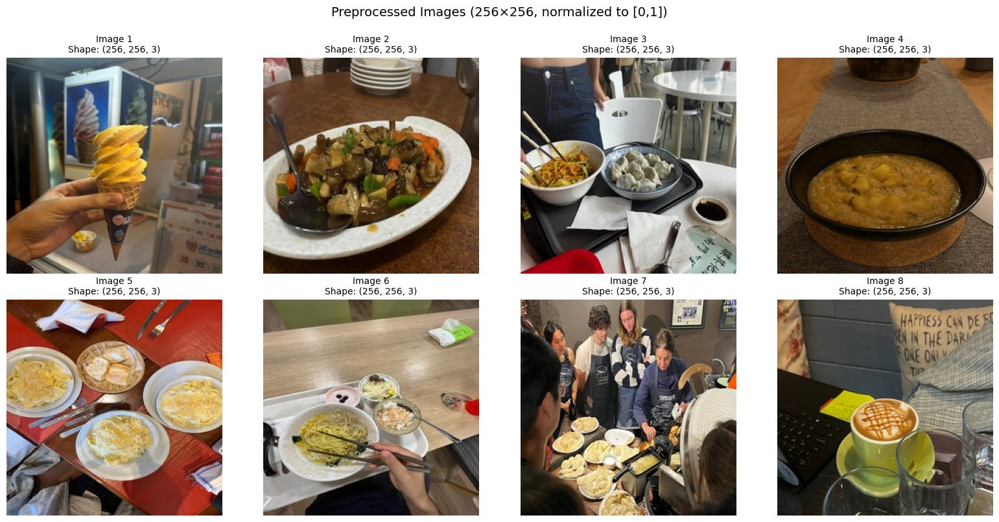

In [ ]:
# Visualize a few preprocessed images to verify they look correct
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for i in range(min(8, len(X_proc))):
    row = i // 4
    col = i % 4

    axes[row, col].imshow(X_proc[i])
    axes[row, col].set_title(f"Image {i+1}\nShape: {X_proc[i].shape}", fontsize=10)
    axes[row, col].axis('off')

plt.suptitle('Preprocessed Images (256×256, normalized to [0,1])', fontsize=14, y=1.0)
plt.tight_layout()
plt.show()

# Exploratory Data Analysis

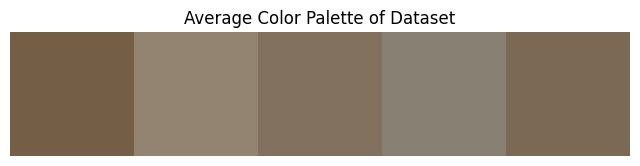

In [ ]:
def extract_palette(img, k=5):
    pixels = img.reshape(-1,3)
    kmeans = KMeans(n_clusters=k, random_state=0).fit(pixels)
    return kmeans.cluster_centers_

palettes = []
for idx in np.random.choice(len(X_proc), 50, replace=False):
    palettes.append(extract_palette(X_proc[idx]))

palettes = np.array(palettes)

avg_palette = palettes.mean(axis=0)
plt.figure(figsize=(8,2))
plt.imshow([avg_palette])
plt.title("Average Color Palette of Dataset")
plt.axis("off")
plt.show()

In [ ]:
# PCA Latent Embedding

# Load all latent files and concatenate them into a single array
X_train_latent = np.concatenate([np.load(p) for p in train_latent_paths], axis=0)
X_val_latent = np.concatenate([np.load(p) for p in val_latent_paths], axis=0)

# Flatten latents for PCA input
X_train_latent_flat = X_train_latent.reshape(len(X_train_latent), -1)
X_val_latent_flat = X_val_latent.reshape(len(X_val_latent), -1)

print(f"Flattened latent shape (train): {X_train_latent_flat.shape}")
print(f"Flattened latent shape (val):   {X_val_latent_flat.shape}")

# Compute PCA (keep 50 principal components)
pca = PCA(n_components=50)
X_train_latent_pca = pca.fit_transform(X_train_latent_flat)
X_val_latent_pca = pca.transform(X_val_latent_flat)

print(f"PCA latent shape (train): {X_train_latent_pca.shape}")
print(f"PCA latent shape (val):   {X_val_latent_pca.shape}")
print(f"Total explained variance (50 components): {pca.explained_variance_ratio_.sum():.4f}")

Flattened latent shape (train): (1450, 4096)
Flattened latent shape (val):   (257, 4096)
PCA latent shape (train): (1450, 50)
PCA latent shape (val):   (257, 50)
Total explained variance (50 components): 0.3755


In [ ]:
# Clustering on SD-VAE Latent Space
# Using flattened latents for clustering
features = X_train_latent_flat

# KMeans
n_clusters = 8
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(features)
print(f"KMeans clusters: {len(np.unique(kmeans_labels))}")

# DBSCAN
dbscan = DBSCAN(eps=50, min_samples=5)
dbscan_labels = dbscan.fit_predict(features)
print(f"DBSCAN clusters: {len(np.unique(dbscan_labels[dbscan_labels != -1]))} (noise: {np.sum(dbscan_labels == -1)})")

# Silhouette scores
kmeans_sil = silhouette_score(features, kmeans_labels)

print(f"\nSilhouette scores:")
print(f"  KMeans: {kmeans_sil:.4f}")

/usr/local/lib/python3.12/dist-packages/diffusers/configuration_utils.py:141: FutureWarning: Accessing config attribute `__iter__` directly via 'DDPMScheduler' object attribute is deprecated. Please access '__iter__' over 'DDPMScheduler's config object instead, e.g. 'scheduler.config.__iter__'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)
/usr/local/lib/python3.12/dist-packages/debugpy/_vendored/pydevd/_pydevd_bundle/pydevd_safe_repr.py:128: FutureWarning: Accessing config attribute `__iter__` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access '__iter__' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.__iter__'.
  if not hasattr(obj, "__iter__"):
/usr/local/lib/python3.12/dist-packages/debugpy/_vendored/pydevd/_pydevd_bundle/pydevd_safe_repr.py:128: FutureWarning: Accessing config attribute `__iter__` directly via 'AutoencoderKL' object attribute is deprecated. Please access '__iter__' o

KMeans clusters: 8
DBSCAN clusters: 0 (noise: 1450)

Silhouette scores:
  KMeans: 0.0143


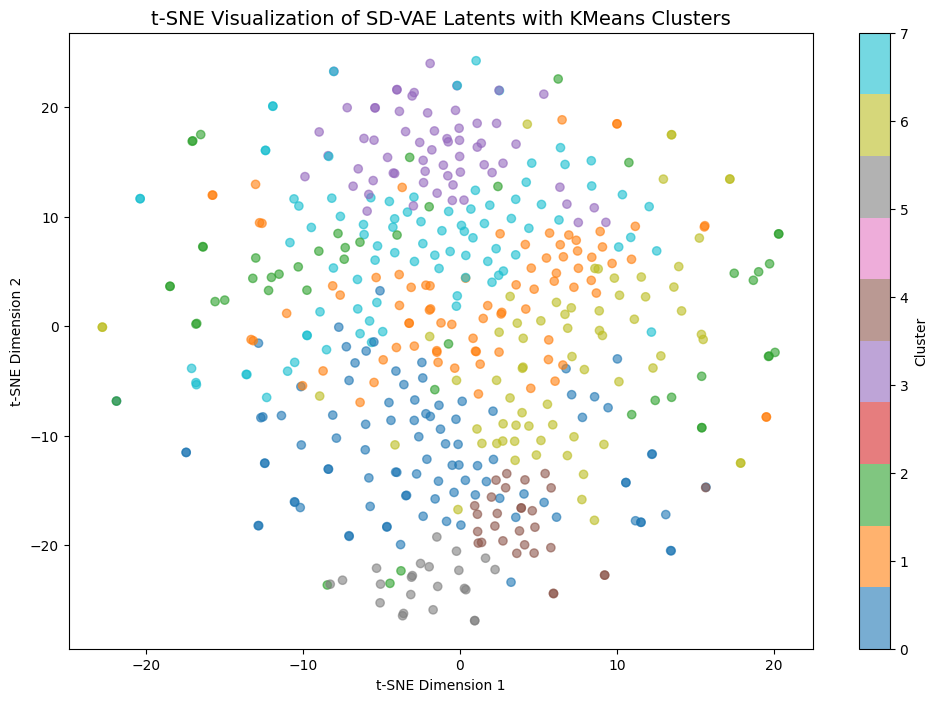

In [ ]:
# t-SNE visualization
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
features_2d = features[:500]
labels_2d = kmeans_labels[:500]
tsne_embedding = tsne.fit_transform(features_2d)

plt.figure(figsize=(12, 8))
scatter = plt.scatter(tsne_embedding[:, 0], tsne_embedding[:, 1], c=labels_2d, cmap='tab10', alpha=0.6)
plt.colorbar(scatter, label='Cluster')
plt.title('t-SNE Visualization of SD-VAE Latents with KMeans Clusters', fontsize=14)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


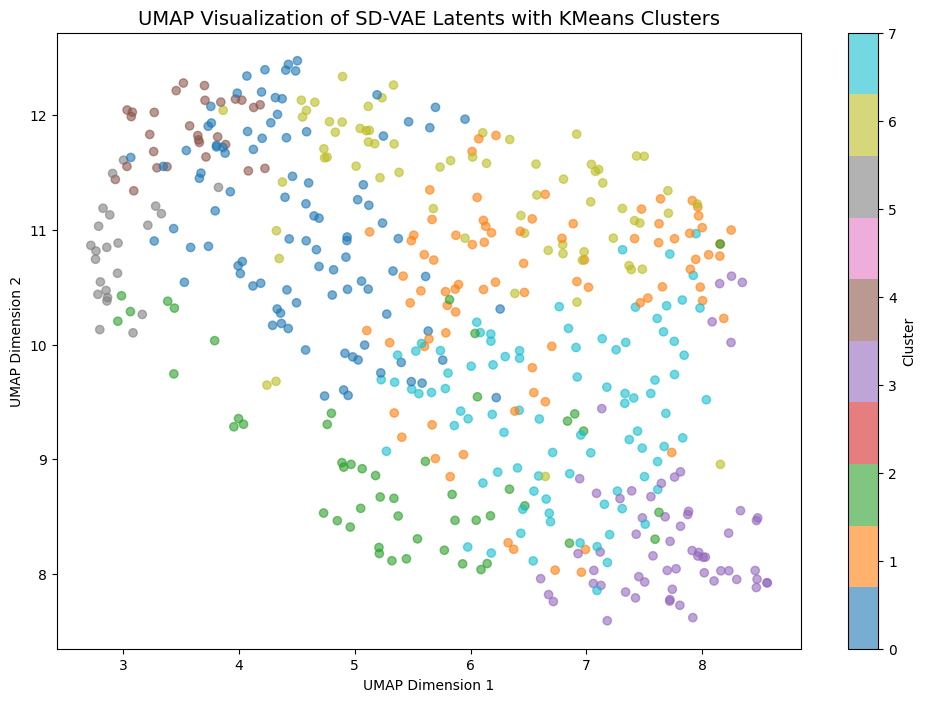

In [ ]:
# UMAP visualization
reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
umap_embedding = reducer.fit_transform(features[:500])

plt.figure(figsize=(12, 8))
scatter = plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=labels_2d, cmap='tab10', alpha=0.6)
plt.colorbar(scatter, label='Cluster')
plt.title('UMAP Visualization of SD-VAE Latents with KMeans Clusters', fontsize=14)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()

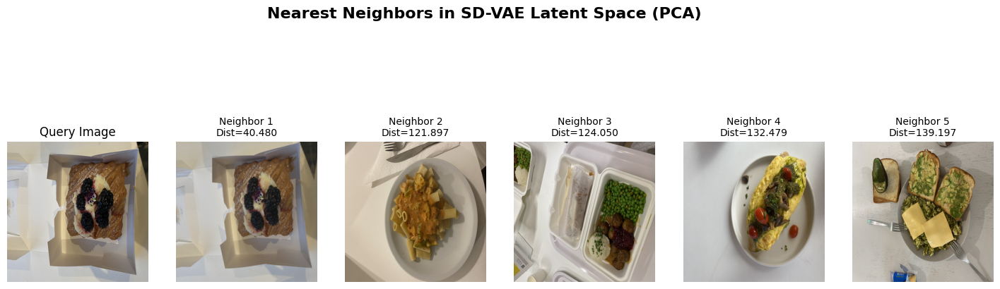

In [ ]:
# Nearest-Neighbor Search in Latent Space (PCA)
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

# Use PCA latents
features = X_train_latent_pca    # shape: (N, 50)
images = X_train                 # shape: (N, 256, 256, 3)

# Fit nearest-neighbor model
nn_model = NearestNeighbors(n_neighbors=6, metric='euclidean')
nn_model.fit(features)

query_index = np.random.randint(0, len(features))
query_latent = features[query_index].reshape(1, -1)

# Find nearest neighbors
distances, indices = nn_model.kneighbors(query_latent)

plt.figure(figsize=(18, 6))
plt.suptitle("Nearest Neighbors in SD-VAE Latent Space (PCA)", fontsize=16, fontweight='bold')

# Show query image
plt.subplot(1, 6, 1)
plt.imshow(images[query_index])
plt.title("Query Image", fontsize=12)
plt.axis("off")

# Show 5 nearest neighbors
for i, idx in enumerate(indices[0][1:]):
    plt.subplot(1, 6, i + 2)
    plt.imshow(images[idx])
    plt.title(f"Neighbor {i+1}\nDist={distances[0][i+1]:.3f}", fontsize=10)
    plt.axis("off")

plt.show()

# Data Augmentation

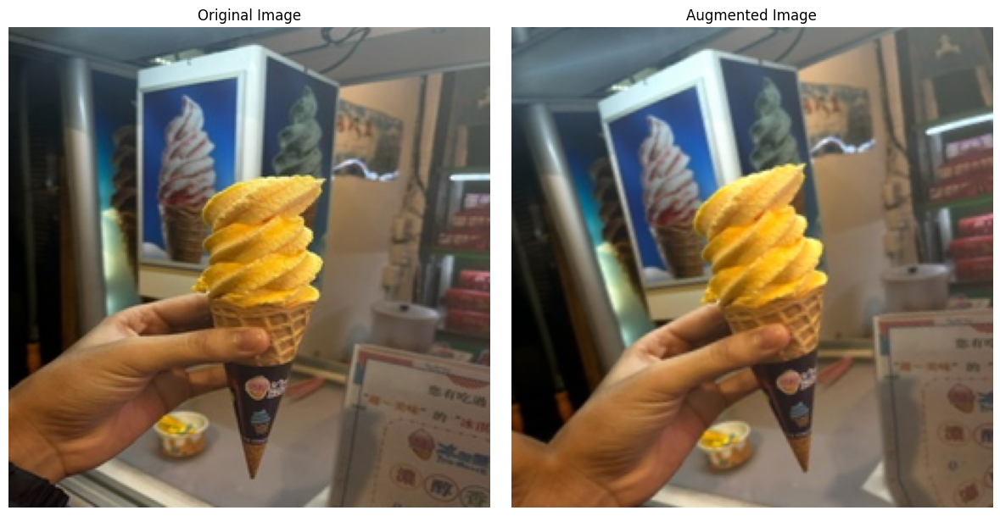

In [ ]:
def augment_image(image, seed=None):
    """
    Apply random augmentations to a single image.

    Parameters:
    - image: NumPy array of shape (H, W, C) with values in [0, 1]
    - seed: Random seed for reproducibility

    Returns:
    - Augmented image array
    """
    if seed is not None:
        np.random.seed(seed)
        random.seed(seed)

    aug_image = image.copy()

    # 1. Random horizontal flip (50% probability)
    if np.random.random() > 0.5:
        aug_image = np.fliplr(aug_image)

    # 2. Random rotation (±15 degrees)
    angle = np.random.uniform(-15, 15)
    aug_image = rotate(aug_image, angle, axes=(0, 1), reshape=False, mode='reflect', order=1)

    # 3. Random brightness adjustment (±20%)
    brightness_factor = np.random.uniform(0.8, 1.2)
    aug_image = np.clip(aug_image * brightness_factor, 0, 1)

    # 4. Random contrast adjustment (±20%)
    contrast_factor = np.random.uniform(0.8, 1.2)
    mean = aug_image.mean()
    aug_image = np.clip((aug_image - mean) * contrast_factor + mean, 0, 1)

    return aug_image

# Test augmentation on a sample image
sample_idx = 0
original = X_proc[sample_idx]
augmented = augment_image(original)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(original)
axes[0].set_title('Original Image', fontsize=12)
axes[0].axis('off')

axes[1].imshow(augmented)
axes[1].set_title('Augmented Image', fontsize=12)
axes[1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Create augmented dataset
# 2 augmented versions per original image (3x total dataset size)

n_augmentations_per_image = 2
augmented_images = []

print(f"Creating {n_augmentations_per_image} augmented versions per image...")
print(f"This will create {n_original * n_augmentations_per_image} additional images")

for i in range(n_original):
    for aug_idx in range(n_augmentations_per_image):
        # Use a unique seed for each augmentation: image_index * n_augmentations + aug_index
        seed = i * n_augmentations_per_image + aug_idx
        aug_img = augment_image(X_proc[i], seed=seed)
        augmented_images.append(aug_img)

    if (i + 1) % 50 == 0:
        print(f"  Augmented {i + 1}/{n_original} images...")

# Stack augmented images
X_aug = np.stack(augmented_images, axis=0)

print(f"\n✓ Created {len(augmented_images)} augmented images")
print(f"  X_aug shape: {X_aug.shape}, dtype: {X_aug.dtype}")

Creating 2 augmented versions per image...
This will create 1138 additional images
  Augmented 50/569 images...
  Augmented 100/569 images...
  Augmented 150/569 images...
  Augmented 200/569 images...
  Augmented 250/569 images...
  Augmented 300/569 images...
  Augmented 350/569 images...
  Augmented 400/569 images...
  Augmented 450/569 images...
  Augmented 500/569 images...
  Augmented 550/569 images...

✓ Created 1138 augmented images
  X_aug shape: (1138, 256, 256, 3), dtype: float32


In [ ]:
# Combine original and augmented images
X_combined = np.concatenate([X_proc, X_aug], axis=0)

print(f"Final dataset shape: {X_combined.shape}")
print(f"  - Original images: {n_original}")
print(f"  - Augmented images: {X_aug.shape[0]}")
print(f"  - Total images: {X_combined.shape[0]}")
print(f"  - Image dimensions: {X_combined.shape[1]}×{X_combined.shape[2]}")
print(f"  - Channels: {X_combined.shape[3]}")
print(f"  - Data type: {X_combined.dtype}")
print(f"  - Value range: [{X_combined.min():.3f}, {X_combined.max():.3f}]")

Final dataset shape: (1707, 256, 256, 3)
  - Original images: 569
  - Augmented images: 1138
  - Total images: 1707
  - Image dimensions: 256×256
  - Channels: 3
  - Data type: float32
  - Value range: [0.000, 1.000]


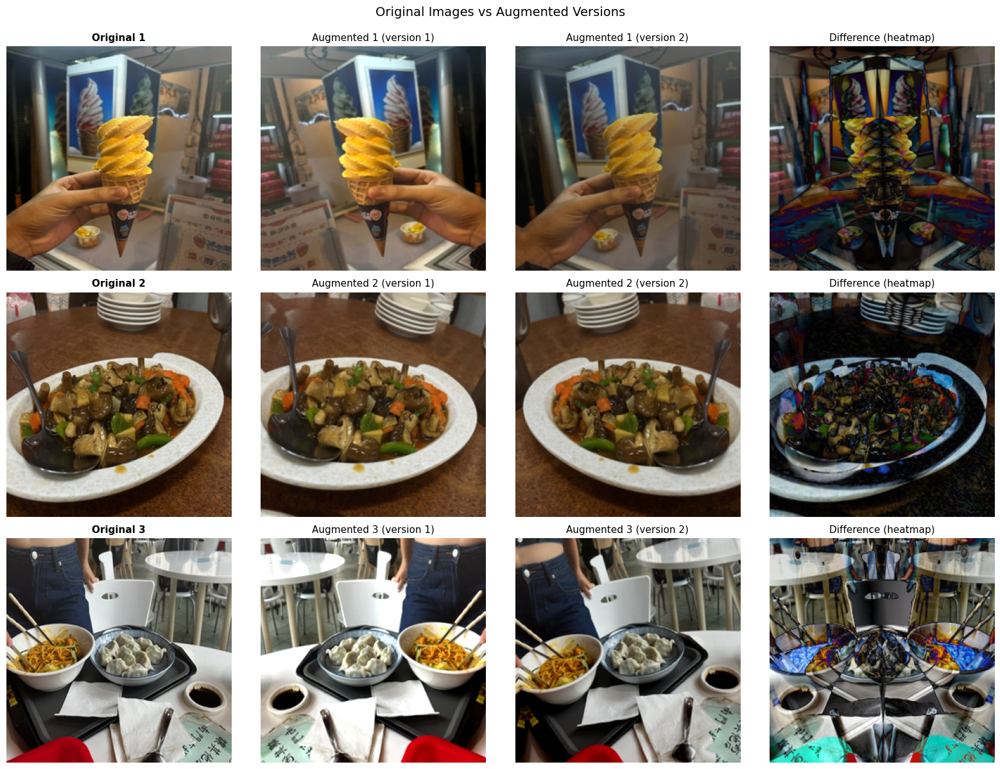

In [ ]:
# Visualize original vs augmented images side by side
fig, axes = plt.subplots(3, 4, figsize=(16, 12))

for i in range(3):
    # Original image
    axes[i, 0].imshow(X_proc[i])
    axes[i, 0].set_title(f'Original {i+1}', fontsize=11, fontweight='bold')
    axes[i, 0].axis('off')

    # First augmentation
    axes[i, 1].imshow(X_aug[i * n_augmentations_per_image])
    axes[i, 1].set_title(f'Augmented {i+1} (version 1)', fontsize=11)
    axes[i, 1].axis('off')

    # Second augmentation
    axes[i, 2].imshow(X_aug[i * n_augmentations_per_image + 1])
    axes[i, 2].set_title(f'Augmented {i+1} (version 2)', fontsize=11)
    axes[i, 2].axis('off')

    # Show difference (for visualization)
    diff = np.abs(X_proc[i] - X_aug[i * n_augmentations_per_image])
    axes[i, 3].imshow(diff, cmap='hot')
    axes[i, 3].set_title(f'Difference (heatmap)', fontsize=11)
    axes[i, 3].axis('off')

plt.suptitle('Original Images vs Augmented Versions', fontsize=14, y=0.995)
plt.tight_layout()
plt.show()

# Splitting the data

In [ ]:
# Split the data into training and validation sets
# We'll use 85% train, 15% validation

train_size = 0.85
random_state = 42

X_train, X_val = train_test_split(
    X_combined,
    train_size=train_size,
    random_state=random_state,
    shuffle=True
)

print(f"Dataset Split:")
print(f"  Training set:   {X_train.shape[0]} images ({X_train.shape[0]/len(X_combined)*100:.1f}%)")
print(f"  Validation set: {X_val.shape[0]} images ({X_val.shape[0]/len(X_combined)*100:.1f}%)")
print(f"  Total:          {len(X_combined)} images")
print(f"\nShapes:")
print(f"  X_train: {X_train.shape}")
print(f"  X_val:   {X_val.shape}")

Dataset Split:
  Training set:   1450 images (84.9%)
  Validation set: 257 images (15.1%)
  Total:          1707 images

Shapes:
  X_train: (1450, 256, 256, 3)
  X_val:   (257, 256, 256, 3)


# Setting up the model

## Stable Diffusion VAE Setup

In [ ]:
# Load Stable Diffusion VAE encoder/decoder

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

vae = AutoencoderKL.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    subfolder="vae"
)
vae = vae.to(device)
vae.eval()  # Set to evaluation mode
print(f"  Latent channels: {vae.config.latent_channels}")

Using device: cuda


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

  Latent channels: 4


In [ ]:
# Test encoding/decoding with correct 256×256 resolution
rand_ind = np.random.randint(0, len(X_train))
test_image = X_train[rand_ind:rand_ind+1]  # Shape: (1, 256, 256, 3) in [0, 1]

# Convert to tensor and normalize to [-1, 1] for encoding
test_tensor = torch.from_numpy(test_image).permute(0, 3, 1, 2).float()
test_tensor = test_tensor * 2.0 - 1.0  # [0, 1] → [-1, 1]
test_tensor = test_tensor.to(device)

# Encode
with torch.no_grad():
    encoded = vae.encode(test_tensor)
    latent = encoded.latent_dist.sample()
    print(f"   Encoded. Latent shape: {latent.shape}")
    print(f"   Expected: (1, 4, 32, 32) for 256×256 input")
    print(f"   Latent stats: mean={latent.mean():.4f}, std={latent.std():.4f}")

# Decode (no scaling needed)
with torch.no_grad():
    decoded = vae.decode(latent).sample
    decoded_np = decoded.cpu().numpy()
    decoded_np = (decoded_np + 1) / 2
    decoded_np = np.clip(decoded_np, 0, 1)
    decoded_np = np.transpose(decoded_np, (0, 2, 3, 1))
    mse = np.mean((test_image - decoded_np) ** 2)
    print(f"   Decoded. Output shape: {decoded_np.shape}")
    print(f"   MSE: {mse:.6f}")

   Encoded. Latent shape: torch.Size([1, 4, 32, 32])
   Expected: (1, 4, 32, 32) for 256×256 input
   Latent stats: mean=0.9247, std=4.6344
   Decoded. Output shape: (1, 256, 256, 3)
   MSE: 0.000909


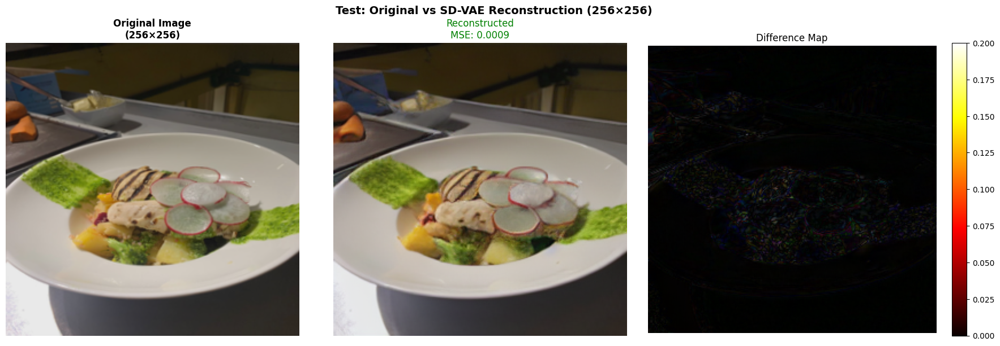

In [ ]:
# Original vs Reconstructed

if 'decoded_np' in locals():
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Original
    axes[0].imshow(test_image[0])
    axes[0].set_title('Original Image\n(256×256)', fontsize=12, fontweight='bold')
    axes[0].axis('off')

    # Reconstructed
    axes[1].imshow(decoded_np[0])
    axes[1].set_title(f'Reconstructed\nMSE: {mse:.4f}', fontsize=12,
                      color='green' if mse < 0.01 else 'orange' if mse < 0.05 else 'red')
    axes[1].axis('off')

    # Difference
    diff = np.abs(test_image[0] - decoded_np[0])
    im = axes[2].imshow(diff, cmap='hot', vmin=0, vmax=0.2)
    axes[2].set_title('Difference Map', fontsize=12)
    axes[2].axis('off')
    plt.colorbar(im, ax=axes[2], fraction=0.046)

    plt.suptitle('Test: Original vs SD-VAE Reconstruction (256×256)',
                 fontsize=14, y=1.0, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Running the model

In [ ]:
def encode_images_to_latent_streaming(images, vae, device, batch_size=8, save_dir="latents"):
    os.makedirs(save_dir, exist_ok=True)
    n = len(images)
    latent_paths = []

    for i in range(0, n, batch_size):
        batch = images[i:i+batch_size]

        batch_tensor = torch.from_numpy(batch).permute(0,3,1,2).float()
        batch_tensor = batch_tensor * 2 - 1
        batch_tensor = batch_tensor.to(device)

        with torch.inference_mode():
            latents = vae.encode(batch_tensor).latent_dist.sample()

        lat_np = latents.cpu().numpy().astype("float16")

        path = f"{save_dir}/batch_{i}.npy"
        np.save(path, lat_np)
        latent_paths.append(path)

        del batch, batch_tensor, latents, lat_np
        gc.collect()

        print(f"Encoded {min(i+batch_size, n)}/{n}")

    return latent_paths

In [ ]:
def decode_latents_streaming(latent_paths, vae, device, save_dir="recon"):
    os.makedirs(save_dir, exist_ok=True)
    out_paths = []
    idx = 0

    for path in latent_paths:
        lat = np.load(path)
        lat_tensor = torch.from_numpy(lat).float().to(device)

        with torch.inference_mode():
            dec = vae.decode(lat_tensor).sample

        dec = (dec + 1) / 2
        dec = dec.clamp(0,1)
        dec_np = dec.permute(0,2,3,1).cpu().numpy()

        for j in range(len(dec_np)):
            out_path = f"{save_dir}/img_{idx}.npy"
            np.save(out_path, dec_np[j])
            out_paths.append(out_path)
            idx += 1

        del lat, lat_tensor, dec, dec_np
        gc.collect()

        print(f"Decoded {idx} images")

    return out_paths


In [ ]:
train_latent_paths = encode_images_to_latent_streaming(
    X_train, vae, device, batch_size=8, save_dir="latents_train"
)

Encoded 8/1450
Encoded 16/1450
Encoded 24/1450
Encoded 32/1450
Encoded 40/1450
Encoded 48/1450
Encoded 56/1450
Encoded 64/1450
Encoded 72/1450
Encoded 80/1450
Encoded 88/1450
Encoded 96/1450
Encoded 104/1450
Encoded 112/1450
Encoded 120/1450
Encoded 128/1450
Encoded 136/1450
Encoded 144/1450
Encoded 152/1450
Encoded 160/1450
Encoded 168/1450
Encoded 176/1450
Encoded 184/1450
Encoded 192/1450
Encoded 200/1450
Encoded 208/1450
Encoded 216/1450
Encoded 224/1450
Encoded 232/1450
Encoded 240/1450
Encoded 248/1450
Encoded 256/1450
Encoded 264/1450
Encoded 272/1450
Encoded 280/1450
Encoded 288/1450
Encoded 296/1450
Encoded 304/1450
Encoded 312/1450
Encoded 320/1450
Encoded 328/1450
Encoded 336/1450
Encoded 344/1450
Encoded 352/1450
Encoded 360/1450
Encoded 368/1450
Encoded 376/1450
Encoded 384/1450
Encoded 392/1450
Encoded 400/1450
Encoded 408/1450
Encoded 416/1450
Encoded 424/1450
Encoded 432/1450
Encoded 440/1450
Encoded 448/1450
Encoded 456/1450
Encoded 464/1450
Encoded 472/1450
Encoded 48

In [ ]:
val_latent_paths = encode_images_to_latent_streaming(
    X_val, vae, device, batch_size=8, save_dir="latents_val"
)

Encoded 8/257
Encoded 16/257
Encoded 24/257
Encoded 32/257
Encoded 40/257
Encoded 48/257
Encoded 56/257
Encoded 64/257
Encoded 72/257
Encoded 80/257
Encoded 88/257
Encoded 96/257
Encoded 104/257
Encoded 112/257
Encoded 120/257
Encoded 128/257
Encoded 136/257
Encoded 144/257
Encoded 152/257
Encoded 160/257
Encoded 168/257
Encoded 176/257
Encoded 184/257
Encoded 192/257
Encoded 200/257
Encoded 208/257
Encoded 216/257
Encoded 224/257
Encoded 232/257
Encoded 240/257
Encoded 248/257
Encoded 256/257
Encoded 257/257


In [ ]:
subset_train = train_latent_paths[:10]   # choose first 10 latent batches
decoded_train = decode_latents_streaming(subset_train, vae, device, save_dir="recon_train")

Decoded 8 images
Decoded 16 images
Decoded 24 images
Decoded 32 images
Decoded 40 images
Decoded 48 images
Decoded 56 images
Decoded 64 images
Decoded 72 images
Decoded 80 images


In [ ]:
subset_val = val_latent_paths[:10]      # choose first 10 latent batches
decoded_val = decode_latents_streaming(subset_val, vae, device, save_dir="recon_val")

Decoded 8 images
Decoded 16 images
Decoded 24 images
Decoded 32 images
Decoded 40 images
Decoded 48 images
Decoded 56 images
Decoded 64 images
Decoded 72 images
Decoded 80 images


In [ ]:
batch_size = 8

# Choose any batch to evaluate (first batch is simplest)
batch_path = train_latent_paths[0]
print("Selected latent file:", batch_path)

# Extract batch ID from filename, e.g. "batch_000.npy" → 0
batch_id = int(batch_path.split("_")[-1].split(".")[0])
print("Batch ID:", batch_id)

# Compute original image indices corresponding to this batch
start = batch_id * batch_size
end = start + batch_size
orig_indices = list(range(start, end))
print("Original image indices:", orig_indices)

# Load the latent batch
latents = np.load(batch_path)
print("Latent batch shape:", latents.shape)

# Decode this batch USING STREAMING. This returns a list of paths to individual decoded images.
decoded_paths_for_batch = decode_latents_streaming([batch_path], vae, device, save_dir="eval_temp")

# Load the individual decoded images from their paths and stack them into a single NumPy array
decoded_batch = []
for p in decoded_paths_for_batch:
    decoded_batch.append(np.load(p))
decoded_batch = np.stack(decoded_batch, axis=0)

print("Decoded batch shape:", decoded_batch.shape)

Selected latent file: latents_train/batch_0.npy
Batch ID: 0
Original image indices: [0, 1, 2, 3, 4, 5, 6, 7]
Latent batch shape: (8, 4, 32, 32)
Decoded 8 images
Decoded batch shape: (8, 256, 256, 3)


In [ ]:
mse_list = []

for i, orig_idx in enumerate(orig_indices):
    orig_img = X_train[orig_idx]
    recon_img = decoded_batch[i]

    mse = np.mean((orig_img - recon_img) ** 2)
    mse_list.append(mse)

mse_batch = np.mean(mse_list)

print("\nReconstruction Quality for Batch:")
print(f"  Mean MSE:  {mse_batch:.6f}")
print(f"  RMSE:      {np.sqrt(mse_batch):.6f}")


Reconstruction Quality for Batch:
  Mean MSE:  0.003308
  RMSE:      0.057511


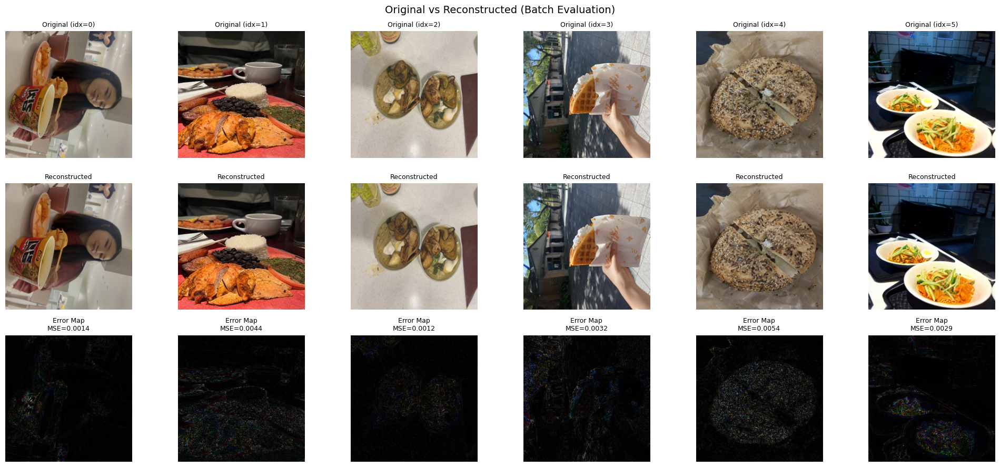

In [ ]:
n_compare = min(6, len(orig_indices))

fig, axes = plt.subplots(3, n_compare, figsize=(20, 9))

for i in range(n_compare):
    orig_idx = orig_indices[i]
    orig_img = X_train[orig_idx]
    recon_img = decoded_batch[i]

    # Row 1 — Original image
    axes[0, i].imshow(orig_img)
    axes[0, i].set_title(f"Original (idx={orig_idx})", fontsize=9)
    axes[0, i].axis("off")

    # Row 2 — Reconstructed
    axes[1, i].imshow(recon_img)
    axes[1, i].set_title("Reconstructed", fontsize=9)
    axes[1, i].axis("off")

    # Row 3 — Difference heatmap
    diff = np.abs(orig_img - recon_img)
    mse = np.mean(diff**2)

    im = axes[2, i].imshow(diff, cmap="hot", vmin=0, vmax=0.2)
    axes[2, i].set_title(f"Error Map\nMSE={mse:.4f}", fontsize=9)
    axes[2, i].axis("off")

plt.suptitle("Original vs Reconstructed (Batch Evaluation)", fontsize=14)
plt.tight_layout()
plt.show()

# Latent Diffusion Model: Generative Training and Sampling

## Latent DDPM with a Minimal Time-Conditioned CNN (Baseline Model)

In [ ]:
class TinyUNet_v2(nn.Module):
    def __init__(self, channels=4, hidden=64, tdim=64):
        super().__init__()

        # Timestep embedding
        self.time_mlp = nn.Sequential(
            nn.Linear(1, tdim),
            nn.ReLU(),
            nn.Linear(tdim, tdim),
            nn.ReLU()
        )

        self.conv1 = nn.Conv2d(channels + tdim, hidden, 3, padding=1)
        self.conv2 = nn.Conv2d(hidden, hidden, 3, padding=1)
        self.conv3 = nn.Conv2d(hidden, channels, 3, padding=1)
        self.relu = nn.ReLU()

    def forward(self, x, t):
        t = t.view(-1, 1)
        t_embed = self.time_mlp(t).unsqueeze(-1).unsqueeze(-1)
        t_embed = t_embed.expand(-1, -1, x.shape[2], x.shape[3])

        x = torch.cat([x, t_embed], dim=1)
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))
        x = self.conv3(x)
        return x

diffusion_model = TinyUNet_v2().to(device)
print("Loaded TinyUNet v2")

Loaded TinyUNet v2


In [ ]:
T = 1000

beta = torch.linspace(1e-4, 0.02, T).to(device)
alpha = 1 - beta
alpha_bar = torch.cumprod(alpha, dim=0)

optimizer = torch.optim.Adam(diffusion_model.parameters(), lr=1e-4)

latents_tensor = torch.from_numpy(X_train_latent[:500]).float().to(device)

steps = 1500
batch_size = 16

print("Training DDPM...")

for step in range(steps):
    idx = torch.randint(0, len(latents_tensor), (batch_size,))
    x0 = latents_tensor[idx]

    t = torch.randint(1, T, (batch_size,), device=device)
    noise = torch.randn_like(x0)

    a_bar = alpha_bar[t].view(-1, 1, 1, 1)
    x_t = torch.sqrt(a_bar) * x0 + torch.sqrt(1 - a_bar) * noise

    pred_noise = diffusion_model(x_t, t.float())

    loss = nn.functional.mse_loss(pred_noise, noise)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if step % 200 == 0:
        print(step, loss.item())

Training DDPM...
0 93.811279296875
200 0.9896387457847595
400 0.9691115617752075
600 0.9378674030303955
800 0.9131677150726318
1000 0.8981828689575195
1200 0.8686449527740479
1400 0.8666119575500488


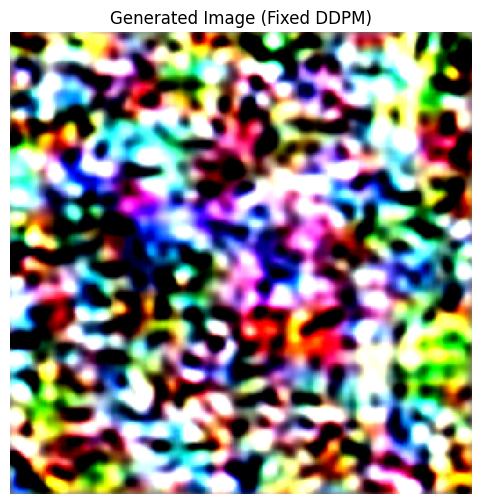

In [ ]:
  diffusion_model.eval()

  with torch.no_grad():
      x = torch.randn(1, 4, 32, 32).to(device)

      for t in reversed(range(1, T)):
          beta_t = beta[t]
          alpha_t = alpha[t]
          alpha_bar_t = alpha_bar[t]

          t_tensor = torch.tensor([t], device=device).float()
          pred_noise = diffusion_model(x, t_tensor)

          x = (1 / torch.sqrt(alpha_t)) * (
              x - ((1 - alpha_t) / torch.sqrt(1 - alpha_bar_t)) * pred_noise
          )

          if t > 1:
              x = x + torch.sqrt(beta_t) * torch.randn_like(x)

  # Decode
  with torch.no_grad():
      decoded = vae.decode(x).sample.cpu().detach().numpy()[0]

  decoded = (decoded + 1) / 2
  decoded = decoded.clip(0, 1)
  decoded = decoded.transpose(1, 2, 0)

  plt.figure(figsize=(6,6))
  plt.imshow(decoded)
  plt.title("Generated Image (Fixed DDPM)")
  plt.axis("off")
  plt.show()

# LoRA Fine-Tuning of a Pretrained Stable Diffusion Model

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load SD components
vae = AutoencoderKL.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="vae").to(device)
unet = UNet2DConditionModel.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="unet").to(device)

scheduler = DDPMScheduler.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="scheduler")

# --- Dataset loader ---
class FoodDataset(Dataset):
    def __init__(self, folder):
        # Use glob.glob to get files matching the pattern
        self.files = glob.glob(folder)
        self.transform = transforms.Compose([
            transforms.Resize((512,512)),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5])
        ])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("RGB")
        img = self.transform(img)
        return img

dataset = FoodDataset("/content/drive/MyDrive/food_images/*")
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

In [ ]:
# Increase recursion limit for deep models like UNet
sys.setrecursionlimit(4000)

# Custom LoRALinear module to replace nn.Linear
class LoRALinear(nn.Module):
    def __init__(self, linear_layer, rank=8, lora_alpha=1.0):
        super().__init__()
        self.linear_layer = linear_layer # The original nn.Linear
        self.in_features = linear_layer.in_features
        self.out_features = linear_layer.out_features
        self.rank = rank
        self.lora_alpha = lora_alpha
        self.scaling = self.lora_alpha / self.rank

        self.lora_down = nn.Linear(self.in_features, rank, bias=False)
        self.lora_up = nn.Linear(rank, self.out_features, bias=False)

        # Initialize lora_up weights to zero and lora_down with Kaiming uniform
        nn.init.zeros_(self.lora_up.weight)
        nn.init.kaiming_uniform_(self.lora_down.weight, a=math.sqrt(5))

        # Freeze the original linear layer's parameters
        for param in self.linear_layer.parameters():
            param.requires_grad = False

    def forward(self, x):
        # Original forward pass
        original_output = self.linear_layer(x)

        # LoRA additive component
        lora_output = self.lora_up(self.lora_down(x)) * self.scaling
        return original_output + lora_output

# Collect (parent_module, child_name, original_child_module) to replace
modules_to_replace = []
for name, module in unet.named_modules():
    for child_name, child_module in module.named_children():
        if isinstance(child_module, nn.Linear):
            modules_to_replace.append((module, child_name, child_module))

# Perform replacement
for parent_module, child_name, original_child_module in modules_to_replace:
    new_lora_layer = LoRALinear(original_child_module, rank=8)
    setattr(parent_module, child_name, new_lora_layer)

# IMPORTANT: Move the entire UNet to the device again to ensure new LoRA layers are on GPU
unet.to(device)

# Freeze everything except LoRA weights
for name, param in unet.named_parameters():
    # Only parameters within LoRALinear (lora_down and lora_up) should be trainable
    if "lora_down" in name or "lora_up" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False # Ensures original_linear_layer params remain frozen

In [ ]:
optimizer = optim.Adam(filter(lambda p: p.requires_grad, unet.parameters()), lr=1e-4)

vae.eval()
unet.train()

num_steps = 1500  # can increase to 5000 for better quality
step = 0

for epoch in range(10):
    for batch in dataloader:
        step += 1
        if step > num_steps:
            break

        batch = batch.to(device)

        # Encode images to SD latent space
        with torch.no_grad():
            latents = vae.encode(batch).latent_dist.sample() * 0.18215

        # Sample random timestep
        noise = torch.randn_like(latents)
        timesteps = torch.randint(0, scheduler.num_train_timesteps, (latents.size(0),), device=device)

        noisy_latents = scheduler.add_noise(latents, noise, timesteps)

        batch_size_current = noisy_latents.shape[0]
        dummy_encoder_hidden_states = torch.zeros(
            (batch_size_current, 77, 768), # 77 tokens, 768 features (standard for SD1.5 CLIP)
            dtype=noisy_latents.dtype,
            device=device
        )
        noise_pred = unet(noisy_latents, timesteps, encoder_hidden_states=dummy_encoder_hidden_states).sample

        loss = torch.nn.functional.mse_loss(noise_pred, noise)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if step % 100 == 0:
            print(f"Step {step} / {num_steps}, Loss = {loss.item():.6f}")

    if step > num_steps:
        break

print("LoRA fine-tuning complete!")

/usr/local/lib/python3.12/dist-packages/diffusers/configuration_utils.py:141: FutureWarning: Accessing config attribute `num_train_timesteps` directly via 'DDPMScheduler' object attribute is deprecated. Please access 'num_train_timesteps' over 'DDPMScheduler's config object instead, e.g. 'scheduler.config.num_train_timesteps'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)


Step 100 / 1500, Loss = 0.116833
Step 200 / 1500, Loss = 0.223462
Step 300 / 1500, Loss = 0.229546
Step 400 / 1500, Loss = 0.124641
Step 500 / 1500, Loss = 0.147510
Step 600 / 1500, Loss = 0.053833
Step 700 / 1500, Loss = 0.179403
Step 800 / 1500, Loss = 0.075595
Step 900 / 1500, Loss = 0.042246
Step 1000 / 1500, Loss = 0.196417
Step 1100 / 1500, Loss = 0.099877
Step 1200 / 1500, Loss = 0.217164
Step 1300 / 1500, Loss = 0.250977
Step 1400 / 1500, Loss = 0.323580
LoRA fine-tuning complete!


Text(0.5, 1.0, 'LoRA Fine-tuned Stable Diffusion Output')

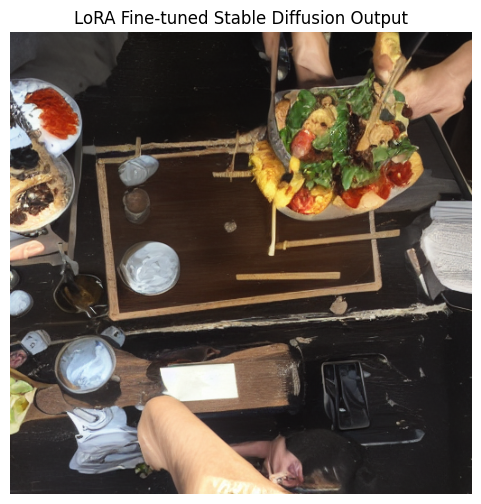

In [ ]:
unet.eval()

with torch.no_grad():
    latents = torch.randn(1, 4, 64, 64).to(device)

    for t in reversed(range(scheduler.num_train_timesteps)):
        latent_model_input = latents

        # Explicitly create dummy encoder_hidden_states for unconditional generation
        # The UNet2DConditionModel expects (batch_size, sequence_length, cross_attention_dim), typically (B, 77, 768)
        batch_size_current = latent_model_input.shape[0]
        dummy_encoder_hidden_states = torch.zeros(
            (batch_size_current, 77, 768), # 77 tokens, 768 features (standard for SD1.5 CLIP)
            dtype=latent_model_input.dtype,
            device=device
        )
        noise_pred = unet(latent_model_input, torch.tensor([t], device=device), encoder_hidden_states=dummy_encoder_hidden_states).sample

        latents = scheduler.step(noise_pred, t, latents).prev_sample

    # Decode via VAE
    image = vae.decode(latents / 0.18215).sample
    image = (image.clamp(-1,1) + 1) / 2
    image = image.cpu().permute(0,2,3,1).numpy()[0]

plt.figure(figsize=(6,6))
plt.imshow(image)
plt.axis("off")
plt.title("LoRA Fine-tuned Stable Diffusion Output")

In [ ]:
!apt-get update
!apt-get install -y pandoc texlive-xetex texlive-fonts-recommended texlive-plain-generic

Hit:1 https://cli.github.com/packages stable InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:5 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading packag

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!jupyter nbconvert --to pdf "/content/drive/MyDrive/Colab Notebooks/Copy of Final_Draft_Pipeline.ipynb"

[NbConvertApp] Converting notebook /content/drive/MyDrive/Colab Notebooks/Copy of Final_Draft_Pipeline.ipynb to pdf
[NbConvertApp] Support files will be in Copy of Final_Draft_Pipeline_files/
[NbConvertApp] Making directory ./Copy of Final_Draft_Pipeline_files
[NbConvertApp] Writing 171754 bytes to notebook.tex
[NbConvertApp] Building PDF
[NbConvertApp] Running xelatex 3 times: ['xelatex', 'notebook.tex', '-quiet']
[NbConvertApp] Running bibtex 1 time: ['bibtex', 'notebook']
[NbConvertApp] WARNING | bibtex had problems, most likely because there were no citations
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 8103695 bytes to /content/drive/MyDrive/Colab Notebooks/Copy of Final_Draft_Pipeline.pdf


In [ ]:
from google.colab import files

files.download("/content/drive/MyDrive/Colab Notebooks/Copy of Final_Draft_Pipeline.pdf")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>